## Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены. <br />

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

## Описание данных

**Файл moscow_places.csv:**
 - name — название заведения;
 - address — адрес заведения;
 - category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
 - hours — информация о днях и часах работы;
 - lat — широта географической точки, в которой находится заведение;
 - lng — долгота географической точки, в которой находится заведение;
 - rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
 - price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
 - avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
         - «Средний счёт: 1000–1500 ₽»;
         - «Цена чашки капучино: 130–220 ₽»;
         - «Цена бокала пива: 400–600 ₽». и так далее;
 - middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
         - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
         - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
         - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
 - middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
         - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
         - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
         - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
 - chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
         - 0 — заведение не является сетевым
         - 1 — заведение является сетевым
 - district — административный район, в котором находится заведение, например Центральный административный округ;
 - seats — количество посадочных мест.

## Содержание

- Загрузка данных
- Предобработка данных
- Анализ данных
- Анализ воронки событий
- Результаты эксперимента

### 1. Загрузка данных

In [1]:
import pandas as pd
import scipy.stats as st
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import seaborn as sns
import math as mth
import warnings
warnings.filterwarnings("ignore")
import json
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster
from folium.features import CustomIcon

In [2]:
try:
    df = pd.read_csv('moscow_places.csv')
except:
    df = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
df.head(1)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.47886,5.0,NaN,NaN,NaN,NaN,0,NaN


### 2. Предобработка данных

In [5]:
#Проверим наличие дубликатов в датасете
df.duplicated().sum()

0

In [6]:
#Проверим наличие пропусков в датасете
round(df.isna().mean(), 2)

name                 0.00
category             0.00
address              0.00
district             0.00
hours                0.06
lat                  0.00
lng                  0.00
rating               0.00
price                0.61
avg_bill             0.55
middle_avg_bill      0.63
middle_coffee_cup    0.94
chain                0.00
seats                0.43
dtype: float64

Большое количество пропущенных значений в столбцах price, avg_bill, middle_avg_bill, middle_coffee_cup(больше 90%) и seats.
Удалить мы не можем такое количество данных, слишком много. Заполнить тоже, есть высокий риск исказить данные. Поэтому пока оставим как есть. 
Большое количество пропусков может быть связано с :
 - некорректная выгрузка данных
 - человеческий фактор (пользовательские параметры просто заполнены).

In [7]:
#Создадим столбец street с названиями улиц из столбца с адресом
df['street'] = df['address'].str.split(', ').str[1]

In [8]:
#Cоздадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
# - логическое значение True — если заведение работает ежедневно и круглосуточно;
# - логическое значение False — в противоположном случае.
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')
df['is_24/7'].unique()

array([False, True, nan], dtype=object)

### 3. Анализ данных

In [9]:
#Исследуем количество объектов общественного питания по категориям
ax_1 = df.groupby('category', as_index=False)['name'].count()
ax_1

,category,name
0,"бар,паб",765
1,булочная,256
2,быстрое питание,603
3,кафе,2378
4,кофейня,1413
5,пиццерия,633
6,ресторан,2043
7,столовая,315


In [10]:
def bar_px_plot(data, x, y, title, x_title, y_title):
    fig = px.bar(data, 
             x=x, 
             y=y, 
            text=x,
            color_discrete_sequence=px.colors.sequential.Magenta)
    fig.update_layout(title = title,
                   xaxis_title = x_title,
                   yaxis_title = y_title)
    fig.show() # выводим график

In [11]:
bar_px_plot(ax_1.sort_values(by='name', ascending=True), ('name'), ('category'),\
            'Распределение заведений по категориям', 'Количество заведений', 'Категории заведений')

Самое большое количество заведений категории кафе. Само маленькое - булочная.

In [12]:
#Исследуем количество посадочных мест по категориям
ax_2 = df.groupby('category')['seats'].count().reset_index()
ax_2['mean'] = round((ax_2['seats']/ax_2['seats'].sum())*100, 2)

In [13]:
bar_px_plot(ax_2.sort_values(by='seats'),('mean'),('category'),\
            'Распределение количества посадочных мест по категориям',\
            'Процент посадочных мест от общего кличества посадочных',\
            'Категории заведений')

Большее количество посадочных мест всех заведений Москвы приходится на рестораны 26%. Самое меньшее у булочных (3%).

Рассмотрим соотношение сетевых и несетевых заведений в датасете. Напомним, значение параметров:
 - 0 — заведение не является сетевым
 - 1 — заведение является сетевым

In [14]:
#Рассмотрим соотношение сетевых и несетевых заведений в датасете
ax_3 = df.groupby('chain', as_index=False)['name'].count()
ax_3 = ax_3.T
ax_3.columns = ['Не сеть', 'Сеть']
ax_3 = ax_3.T

In [15]:
bar_px_plot(ax_3.sort_values(by='name', ascending=True),('name'), ax_3.index,\
            'Cоотношение сетевых и несетевых заведений',\
            'Количество заведений',\
            'Категории заведений (не сеть/сеть)')

Сетевых заведений на порядок меньше. Большее количество мест общественного питаний - не сеть.

In [16]:
#Рассчитаем количество заведений каждой 
ax_5 = df.groupby('category').agg({'name':'count'}).sort_values(by='category')
ax_5

,name
category,
"бар,паб",765
булочная,256
быстрое питание,603
кафе,2378
кофейня,1413
пиццерия,633
ресторан,2043
столовая,315


In [17]:
bar_px_plot(ax_5.sort_values(by='name'),('name'),ax_5.index,\
            "Количество заведений каждой категории",\
            'Категории заведений',\
            'Количество заведений')

In [18]:
#Рассмотрим какие категории заведений чаще являются сетевыми
ax_4 = df.groupby(['category', 'chain']).agg({'name':'count'}).query('chain==1').sort_values(by='category')
ax_4['percent'] = round((ax_4['name']/(ax_5['name'])*100),2)
ax_4 = ax_4.reset_index().drop(['chain','name'], axis=1)

In [19]:
bar_px_plot(ax_4.sort_values(by='percent'),('percent'),('category'),\
            'Доля несетевых заведений в каждой категории общественного питания',\
            'Категории заведений',\
            'Доля несетевых заведений')

In [20]:
#Найдем топ-15 популярных сетей в Москве
ax_6=df.pivot_table(index=['name','category'], values='address', aggfunc='count')\
    .sort_values(by='address', ascending=False).reset_index().head(15)
ax_6

,name,category,address
0,Кафе,кафе,159
1,Шоколадница,кофейня,119
2,Домино'с Пицца,пиццерия,76
3,Додо Пицца,пиццерия,74
4,One Price Coffee,кофейня,71
5,Яндекс Лавка,ресторан,69
6,Cofix,кофейня,65
7,Prime,ресторан,49
8,КОФЕПОРТ,кофейня,42
9,Кулинарная лавка братьев Караваевых,кафе,39


In [21]:
fig = px.sunburst(
    ax_6.sort_values('category'),
    names='name',
    parents='category',
    values='address',
)
fig.show()

In [22]:
bar_px_plot(ax_6.sort_values('category'),('address'), ('name'),\
            'ТОП-15 популярных сетей общественного питанния в Москве',\
            'Наименование сетей',\
            'Количество заведений')

Следует отметить заведения "Кафе", "Шаурма" и "Чайхона", которые не является сетью, (разные ИП), но из-за специфики однотипных заведений и отсутствия полных данных об владельцах, воспринимается в датасете как сеть.

В большей степени самыми популярными являются большие бренды (Шоколадница, Домино'с Пицца, Додо Пицца).<br />

In [23]:
#Рассмотрим административные районы Москвы присутствуют в датасете
ax_7 = df.groupby('district', as_index=False)['name'].count()

In [24]:
#я очень много потратила времени, но так и не поняла, как менять цвета на графике при такой записи
#пробовала вот такой вариант, но он ругается на colors (в документации написано задавать списком или картежем):

#colors = ['darkslategray', 'darkslategrey', 'darkviolet', 'deeppink', 'deepskyblue', 'dimgray', 'dimgrey', 'dodgerblue', 'firebrick']
#fig.update_traces(marker = dict(color=colors, line=dict(color='#000000', width=1.5)))

In [25]:
# строим диаграмму с сегментами

fig = go.Figure(data=[go.Pie(labels=ax_7['district'], # указываем значения, которые появятся на метках сегментов
                             values=ax_7['name'], # указываем данные, которые отобразятся на графике
                             pull = [0, 0, 0, 0, 0, 0.1])]
                      ) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Распределение количества заведений общепита по районам Москвы', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Районы Москвы',
                                    showarrow=False,
                                   ),],
                 )
fig.show() # выводим график

На Центральный административный округ приходится более 25% всех заведений общепита.

In [26]:
ax_8 = df.groupby(['district', 'category'], as_index=False)['name'].count()
ax_8_centr = ax_8.query('district=="Центральный административный округ"')
ax_8_east = ax_8.query('district=="Восточный административный округ"')
ax_8_west = ax_8.query('district=="Западный административный округ"')
ax_8_north = ax_8.query('district=="Северный административный округ"')
ax_8_north_east = ax_8.query('district=="Северо-Восточный административный округ"')
ax_8_north_west = ax_8.query('district=="Северо-Западный административный округ"')
ax_8_south = ax_8.query('district=="Южный административный округ"')
ax_8_south_east = ax_8.query('district=="Юго-Восточный административный округ"')
ax_8_south_west = ax_8.query('district=="Юго-Западный административный округ"')

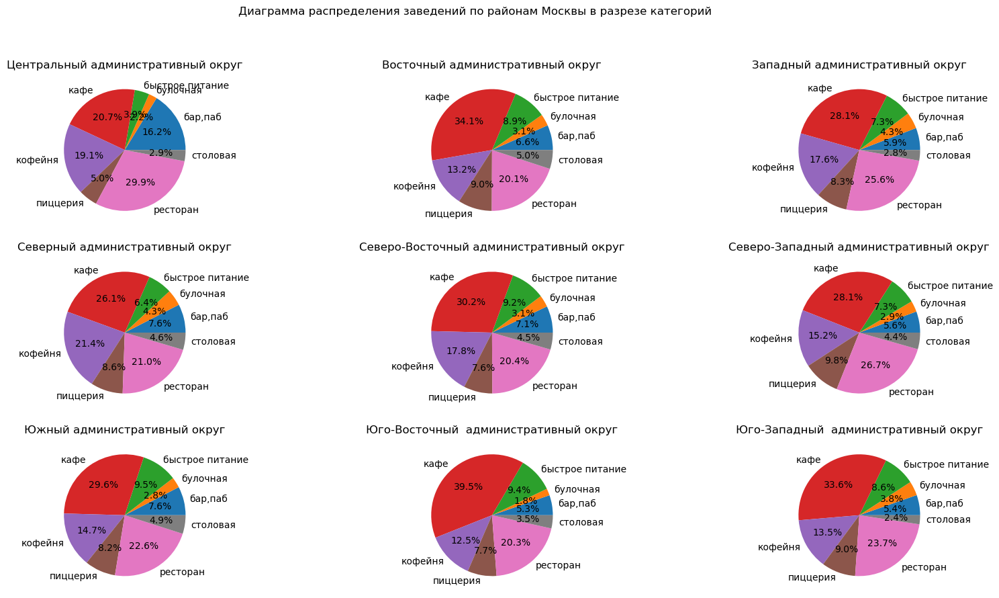

In [27]:
fig, ax=plt.subplots(3,3, figsize=(20,10))
ax[0,0].pie(data=ax_8_centr, x='name', labels='category', autopct = '%.1f%%')
ax[0,0].set_title("Центральный административный округ")
ax[0,1].pie(data=ax_8_east, x='name', labels='category', autopct = '%.1f%%')
ax[0,1].set_title("Восточный административный округ")
ax[0,2].pie(data=ax_8_west, x='name', labels='category', autopct = '%.1f%%')
ax[0,2].set_title("Западный административный округ")
ax[1,0].pie(data=ax_8_north, x='name', labels='category', autopct = '%.1f%%')
ax[1,0].set_title("Северный административный округ")
ax[1,1].pie(data=ax_8_north_east, x='name', labels='category', autopct = '%.1f%%')
ax[1,1].set_title("Северо-Восточный административный округ")
ax[1,2].pie(data=ax_8_north_west, x='name', labels='category', autopct = '%.1f%%')
ax[1,2].set_title("Северо-Западный административный округ")
ax[2,0].pie(data=ax_8_south, x='name', labels='category', autopct = '%.1f%%')
ax[2,0].set_title("Южный административный округ")
ax[2,1].pie(data=ax_8_south_east, x='name', labels='category', autopct = '%.1f%%')
ax[2,1].set_title("Юго-Восточный  административный округ")
ax[2,2].pie(data=ax_8_south_west, x='name', labels='category', autopct = '%.1f%%')
ax[2,2].set_title("Юго-Западный  административный округ")
fig.suptitle('Диаграмма распределения заведений по районам Москвы в разрезе категорий')
plt.show()

Самым распространенным типом заведения является кафе и рестораны. Реже всех встречаются булочные.

In [28]:
ax_9_1 = df.groupby('category', as_index=False)['rating'].apply(lambda rating: '{0:.2f}'.format(rating.median()))
ax_9_1.sort_values(by='rating')

,category,rating
2,быстрое питание,4.20
3,кафе,4.20
1,булочная,4.30
4,кофейня,4.30
5,пиццерия,4.30
6,ресторан,4.30
7,столовая,4.30
0,"бар,паб",4.40


In [29]:
ax_9 = df.groupby('category', as_index=False)["rating"].median()
ax_9.sort_values(by='rating')

,category,rating
2,быстрое питание,4.2
3,кафе,4.2
1,булочная,4.3
4,кофейня,4.3
5,пиццерия,4.3
6,ресторан,4.3
7,столовая,4.3
0,"бар,паб",4.4


In [30]:
# строим столбчатую диаграмму
fig = px.bar(ax_9.sort_values(by='rating'),
            y = 'category',
            x = 'rating',
            text = 'rating',
          )

# оформляем график
fig.update_layout(title='Распределение средних рейтингов по категориям',
                   xaxis_title='Наименование категорий',
                   yaxis_title='Средний рейтинг',
                  xaxis_range=[4,4.5])
             
fig.show() # выводим график

Все категории оценены высоко и разницы между средними оценками не большие. Но при этом самая высокая оценка у пабоа и баров. Самые низкие - у быстрого питания и кафе

In [31]:
#Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 
ax_10 = df.groupby('district', as_index=False)['rating'].agg('median')
ax_10

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [32]:
# читаем файл c границами районов Москвы и сохраняем в переменной
try:
    with open('admin_level_geomap1.geojson', 'r') as f:
        geo_json = json.load(f)
except:
    with open('/datasets/admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)

In [33]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=ax_10,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.7,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

In [34]:
#Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium

# создаём карту Москвы
r = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(r)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
r

In [35]:
#Найдем топ-15 улиц по количеству заведений
ax_11 = df.groupby('street', as_index=False)['name'].count()

In [36]:
bar_px_plot(ax_11.sort_values(by='name', ascending=False).head(15),('name'),('street'),\
            'ТОП-15 улиц по Москвы по количеству заведений общепита',\
            'Количество кафе','Наименование улиц',\
            )

In [37]:
#Найдите улицы, на которых находится только один объект общепита
ax_12 = df.groupby('street', as_index=False)['name'].count().query('name==1')['street']
ax_13 = df.query('street in @ax_12')

In [38]:
# создаём карту Москвы
q = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(q)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
ax_13.apply(create_clusters, axis=1)

# выводим карту
q

In [39]:
#Проанализируем цены в заведениях в каждом районе, используя усредненные оценки средних чеков.
ax_14 = df.groupby('district', as_index=False)['middle_avg_bill'].median()

In [40]:
# создаём карту Москвы
s = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=ax_14,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.7,
    legend_name='Медианные цены в заведениях по районам',
).add_to(s)

# выводим карту
s

Высокие цены отмечаются в ЦАО и в Западном административном округе. Возможно, это связано с более элитным жильем и большим количеством бизнес-центров и офисов государственного управления в этих районах.

**Промежуточный вывод:**
1. Самым популярной категорией заведений являются кафе и рестораны
2. Самыми популярными сетями являются федеральные сети общепита, больше бренды как "Шоколадница", "Доменос пицца", "Додо" и др.
3. улица Проспект Мира -  самая "густонаселенная" улица заведениями общепита
4. Самый высокий рейтинг у заведений в ЦАО
5. Самые высокие цены у заведений в ЦАО и ЗАО.

### 4. Детализируем исследование: открытие кофейни

In [41]:
#Сколько всего кофеен в датасете?
len(df.query('category=="кафе"'))

2378

In [42]:
#В каких районах их больше всего, каковы особенности их расположения?
ax_15 = df.query('category=="кафе"').groupby('district', as_index=False)['name'].count().sort_values(by='name')

In [43]:
# создаём карту Москвы
s = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=ax_15,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.7,
    legend_name='Количество кафе в каждом районе',
).add_to(s)

# выводим карту
s

In [44]:
# создаём карту Москвы
d = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(d)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.query('category == "кафе"').apply(create_clusters, axis=1)

# выводим карту
d

Самое большое количество кафе в ЦАО, самое меньшее - в северо-западном административном округе.

In [45]:
#Сколько круглосуточных кафе
ax_16 = df.loc[df['category']=='кафе'][df['is_24/7']==True]
len(ax_16)

267

In [46]:
# создаём карту Москвы
z = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(z)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
ax_16.apply(create_clusters, axis=1)

# выводим карту
z

Больше всего круглосуточных кафе находится в ЦАО и ЗАО.

In [47]:
#Какие у кафеен рейтинги и как они распределяются по районам
ax_17 = df.query('category=="кафе"').groupby('district', as_index=False)['rating'].median()

In [48]:
# создаём карту Москвы
f = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=ax_17,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.7,
    legend_name='Медианный рейтинг кафе по районам',
).add_to(f)

# выводим карту
f

Самый высокий рейтинг кафе (из тех данных, что у нас имеются) в ЦАО и САО.

In [49]:
#На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

#Данные без пропусков
ax_18 = df[df['middle_coffee_cup'].notnull() == True]

ax_18.query('category == "кафе"')['district'].unique()
#поскольку данные о стоимости чашки кофе в кафе есть только по трем районам, рассмотрим стоимость чашки кофе во всех топах заведениях

array(['Северо-Западный административный округ',
       'Северный административный округ', 'Южный административный округ'],
      dtype=object)

In [50]:
bar_px_plot(ax_18.groupby(['district'], as_index=False)['middle_coffee_cup'].median()\
             .sort_values(by='middle_coffee_cup', ascending=False).head(15),('middle_coffee_cup'),('district'),\
            'Стоимость чашки кофе в разрезе районов по всем заведения',\
            'Средняя стоимость чашки кофе','Наименование района',\
            )

**Вывод:**
1. Самый густонаселенный кафе район - ЦАО
2. Самые высокие рейтинги (стоит учитывать, что оценка произведена с большим количеством пропущенных данных) в районах ЦАО и САО.
3. При формирования цены на чашку кофе стоит ориентироваться на среднюю цену в выбранном районе.